In [ ]:
!git clone https://github.com/misbah4064/opencvTutorial.git                       #Clone GitHub reporsitory (!git clone)
%cd opencvTutorial/                                                               #Change directory to newly cloned repository (%cd)
from IPython.display import clear_output                                          #Clear cell outputs
clear_output()

## **Face Detection Using Haar Cascade**

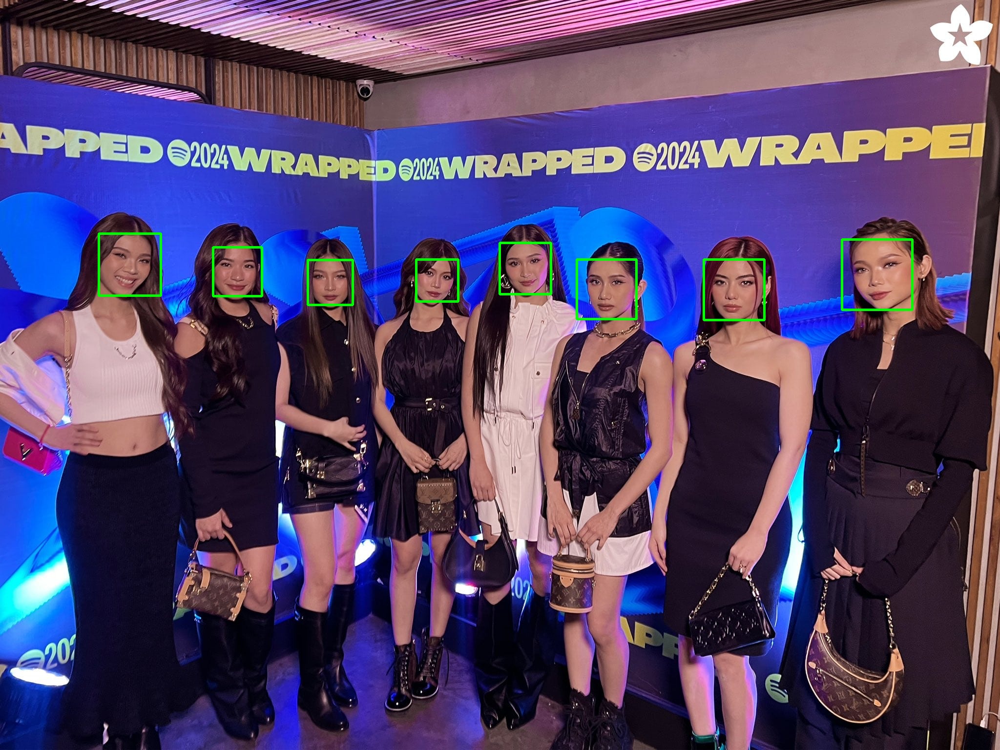

In [ ]:
import cv2                                                                        #Import OpenCV library for image processing
from google.colab.patches import cv2_imshow                                       #Display image (cv2_imshow)

face_cascade = cv2.CascadeClassifier("files/haarcascade_frontalface_default.xml") #Haar Cascade Classifier for detecting frontal faces
img = cv2.imread("/content/3b962895-243d-4d9b-b9d8-85a98dacf4f0.jpg")             #Read image (img)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)                                       #Convert image to grayscale (intensity values > color)

faces = face_cascade.detectMultiScale(gray,1.3,5)                                 #Detect faces with (1.3, 5) parameters
# print(faces)                                                                     ##how much the image size is reduced (1.3), minimum number of neighbors (5)
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 4)                    #Draw rectangles around detected faces
                                                                                   ##rectangle's color is green (0, 255, 0) and thickness of (4)
cv2_imshow(img)                                                                   #Show processed image woth rectangles around faces detected

## **Project 2: Face Recognition**

In [ ]:
!git clone https://github.com/misbah4064/face_recognition.git                     #Clone GitHub Repository (!git clone)
!pip install face_recognition                                                     #Install face_recognition library using pip (python package installer)
%cd face_recognition                                                              #Change directory to newly cloned repository (%cd)

Cloning into 'face_recognition'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 26 (delta 5), reused 23 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (26/26), 3.03 MiB | 5.96 MiB/s, done.
Resolving deltas: 100% (5/5), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566162 sha256=771c2ea7c5689a34b9a0c8bdc92f22c4f8b73f27c15523499fd8be35b3ca62cb
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models
/content/opencvTutorial/face_recognition


Create Encoding Profiles using known face images

##Run Face Recognition on unknown faces

In [ ]:
#Import libraries
import face_recognition
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

#Creating the encoding profiles
face_1 = face_recognition.load_image_file("/content/Colet.PNG")
face_1_encoding = face_recognition.face_encodings(face_1)[0]

face_2 = face_recognition.load_image_file("/content/Mikha.PNG")
face_2_encoding = face_recognition.face_encodings(face_2)[0]

face_3 = face_recognition.load_image_file("/content/Stacey.PNG")
face_3_encoding = face_recognition.face_encodings(face_3)[0]

face_4 = face_recognition.load_image_file("/content/aiah.PNG")
face_4_encoding = face_recognition.face_encodings(face_4)[0]

face_5 = face_recognition.load_image_file("/content/gwen.PNG")
face_5_encoding = face_recognition.face_encodings(face_5)[0]

face_6 = face_recognition.load_image_file("/content/jhoanna.PNG")
face_6_encoding = face_recognition.face_encodings(face_6)[0]

face_7 = face_recognition.load_image_file("/content/maloi.PNG")
face_7_encoding = face_recognition.face_encodings(face_7)[0]

face_8 = face_recognition.load_image_file("/content/sheena.PNG")
face_8_encoding = face_recognition.face_encodings(face_8)[0]

#Store encodings and names
known_face_encodings = [
                        face_1_encoding,
                        face_2_encoding,
                        face_3_encoding,
                        face_4_encoding,
                        face_5_encoding,
                        face_6_encoding,
                        face_7_encoding,
                        face_8_encoding,
]

known_face_names = [
                    "BINI Colet",
                    "BINI Mikha",
                    "BINI Stacey",
                    "BINI Aiah",
                    "BINI Gwen",
                    "BINI Jhoanna",
                    "BINI Maloi",
                    "BINI Sheena",

]

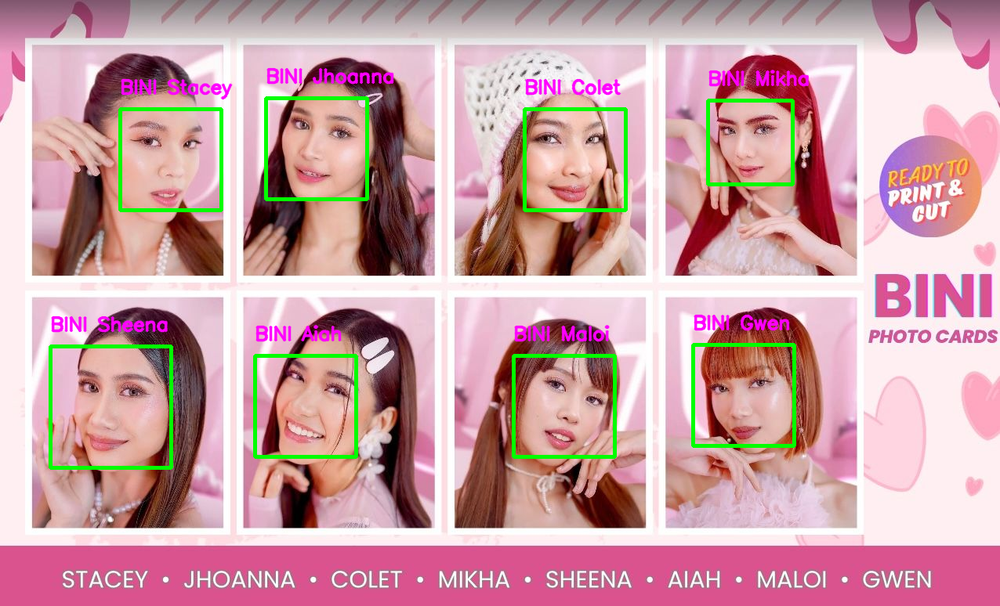

In [ ]:
#Load the unknown image
file_name = "/content/photocarts.jpeg"
unknown_image = face_recognition.load_image_file(file_name)
unknown_image_to_draw = cv2.imread(file_name)

#Find face locations and encodings
face_locations = face_recognition.face_locations(unknown_image)
face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

#Iterate through detected faces
for (top,right, bottom, left), face_encoding in zip(face_locations, face_encodings):
  matches = face_recognition.compare_faces(known_face_encodings, face_encoding)   #Check if the current face encoding matches any known encodings

  name = "Fan"

  face_distances = face_recognition.face_distance(known_face_encodings, face_encoding)
  best_match_index = np.argmin(face_distances)
  if matches[best_match_index]:
    name = known_face_names[best_match_index]

  #Face detection for Fan
  cv2.rectangle(unknown_image_to_draw, (left, top), (right, bottom),(0,255,0),3)
  cv2.putText(unknown_image_to_draw,name, (left, top-20), cv2.FONT_HERSHEY_SIMPLEX,0.8,(255, 0, 255),2, cv2.LINE_AA)


cv2_imshow(unknown_image_to_draw) #Display modified image


In [ ]:
#Import libraries
import face_recognition
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

# Creating the encoding profiles
face_1 = face_recognition.load_image_file("/content/Colet.PNG")
face_1_encoding = face_recognition.face_encodings(face_1)[0]

face_2 = face_recognition.load_image_file("/content/Mikha.PNG")
face_2_encoding = face_recognition.face_encodings(face_2)[0]

face_3 = face_recognition.load_image_file("/content/Stacey.PNG")
face_3_encoding = face_recognition.face_encodings(face_3)[0]

face_4 = face_recognition.load_image_file("/content/aiah1.PNG")
face_4_encoding = face_recognition.face_encodings(face_4)[0]

face_5 = face_recognition.load_image_file("/content/gwen1.PNG")
face_5_encoding = face_recognition.face_encodings(face_5)[0]

face_6 = face_recognition.load_image_file("/content/jhoanna.PNG")
face_6_encoding = face_recognition.face_encodings(face_6)[0]

face_7 = face_recognition.load_image_file("/content/Maloi1.PNG")
face_7_encoding = face_recognition.face_encodings(face_7)[0]

face_8 = face_recognition.load_image_file("/content/sheena.PNG")
face_8_encoding = face_recognition.face_encodings(face_8)[0]

face_9 = face_recognition.load_image_file("/content/binimaloii.PNG")
face_9_encoding = face_recognition.face_encodings(face_1)[0]

#Store encodings and names
known_face_encodings = [
                        face_1_encoding,
                        face_2_encoding,
                        face_3_encoding,
                        face_4_encoding,
                        face_5_encoding,
                        face_6_encoding,
                        face_7_encoding,
                        face_8_encoding,
]

known_face_names = [
                    "BINI Colet",
                    "BINI Mikha",
                    "BINI Stacey",
                    "BINI Aiah",
                    "BINI Gwen",
                    "BINI Jhoanna",
                    "BINI Maloi",
                    "BINI Sheena",

]

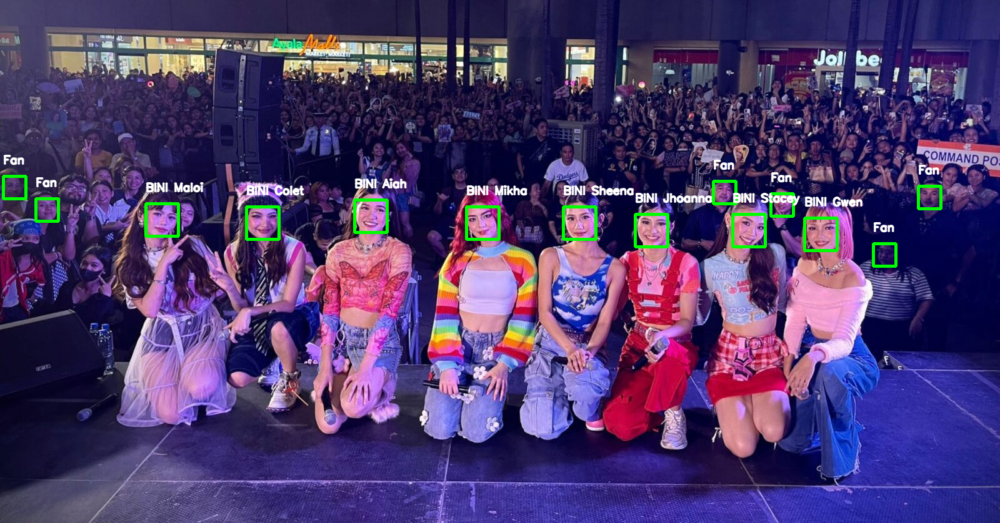

In [ ]:
#Load the unknown image
file_name = "/content/fans ng bini.jpg"
unknown_image = face_recognition.load_image_file(file_name)
unknown_image_to_draw = cv2.imread(file_name)

#Find face locations and encodings
face_locations = face_recognition.face_locations(unknown_image)
face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

#Iterate through detected faces
for (top,right, bottom, left), face_encoding in zip(face_locations, face_encodings):
  matches = face_recognition.compare_faces(known_face_encodings, face_encoding)

  name = "Fan"

  face_distances = face_recognition.face_distance(known_face_encodings, face_encoding)
  best_match_index = np.argmin(face_distances)
  if matches[best_match_index]:
    name = known_face_names[best_match_index]

  #Face detection for Fan
  cv2.rectangle(unknown_image_to_draw, (left, top), (right, bottom),(0,255,0),3)
  cv2.putText(unknown_image_to_draw,name, (left, top-20), cv2.FONT_HERSHEY_SIMPLEX,0.6,(255, 255, 255),2, cv2.LINE_AA)


cv2_imshow(unknown_image_to_draw) #Display modified image
